### Install dependencies

In [ ]:
pip install lightning

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 26.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.4/66.4 kB 6.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 70.7/70.7 kB 7.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 65.7/65.7 kB 6.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 596.7/596.7 kB 46.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.7/45.7 kB 4.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 69.8/69.8 kB 6.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 731.6/731.6 kB 46.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.5/59.5 kB 5.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.9/129.9 kB 10.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 722.8/722.8 kB 51.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.0/67.0 kB 7.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

### Cloning code library

In [ ]:
!git clone https://github.com/mkthoma/custom_yolo.git

Cloning into 'custom_yolo'...
remote: Enumerating objects: 49, done.
remote: Counting objects: 100% (49/49), done.
remote: Compressing objects: 100% (32/32), done.
remote: Total 49 (delta 24), reused 41 (delta 16), pack-reused 0
Receiving objects: 100% (49/49), 20.19 KiB | 6.73 MiB/s, done.
Resolving deltas: 100% (24/24), done.


### Cloning Pascal VOC data from Google Drive

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

import zipfile

zip_file_path = '/content/gdrive/My Drive/ERA_Pascal_VOC/archive.zip'
extract_path = '/content'

with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)

Mounted at /content/gdrive


In [ ]:
import torch
import torch.optim as optim
import lightning.pytorch as pl
from tqdm import tqdm
from custom_yolo.custom_library.utils import get_loaders, load_checkpoint, check_class_accuracy, intersection_over_union
from custom_yolo.custom_library import config
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from custom_yolo.custom_library.lightning_model import YOLOv3Lightning

#### Timer for total execution time

In [ ]:
import time
t0 = time.time()

### Defining model and trainer for lightning module

In [ ]:
from lightning.pytorch.callbacks import ModelCheckpoint, LearningRateMonitor
from custom_yolo.custom_library.callbacks import plot_examples_callback, class_accuracy_callback, map_callback

#Debug option
# trainer = pl.Trainer(precision=16, fast_dev_run=True,
#                               callbacks=[ModelCheckpoint(dirpath=config.CHECKPOINT_PATH,verbose=True,),
#                               PlotTestExamplesCallback(epoch_interval=10),
#                               CheckClassAccuracyCallback(train_epoch_interval=1, test_epoch_interval=10),
#                               MAPCallback(epoch_interval=10),
#                               LearningRateMonitor()])

# Initialize the model
model = YOLOv3Lightning(config=config)

total_epochs = int(config.NUM_EPOCHS * 0.4)

trainer = pl.Trainer(precision=16, max_epochs=total_epochs,
                              callbacks=[ModelCheckpoint(dirpath=config.CHECKPOINT_PATH,verbose=True,),
                              class_accuracy_callback(train_epoch_interval=1, test_epoch_interval=10),
                              plot_examples_callback(epoch_interval=10),
                              map_callback(epoch_interval=total_epochs),
                              LearningRateMonitor()])


/usr/local/lib/python3.10/dist-packages/lightning/fabric/connector.py:554: UserWarning: 16 is supported for historical reasons but its usage is discouraged. Please set your precision to 16-mixed instead!
  rank_zero_warn(
INFO: Using 16bit Automatic Mixed Precision (AMP)
INFO:lightning.pytorch.utilities.rank_zero:Using 16bit Automatic Mixed Precision (AMP)
INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
INFO:lightning.pytorch.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs


### Finding Max LR

INFO: You are using a CUDA device ('NVIDIA A100-SXM4-40GB') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
INFO:lightning.pytorch.utilities.rank_zero:You are using a CUDA device ('NVIDIA A100-SXM4-40GB') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/torch/optim/lr_scheduler.py:139: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  warnings.warn("Detected call of `lr_scheduler.step()` before `optimizer.step()`. "
INFO: LR finder stopped early after 92 steps due to diverging loss.
INFO:lightning.pytorch.tuner.lr_finder:LR finder stopped early after 92 steps due to diverging loss.
INFO: Learning rate set to 0.005754399373371567
INFO:lightning.pytorch.tuner.lr_finder:Learning rate set to 0.005754399373371567
INFO: Restoring states from the checkpoint path at /content/.lr_find_529e4b2d-9c5a-4c8c-976d-21cc24ddd6d4.ckpt
INFO:lightning.pytorch.utilities.rank_zero:

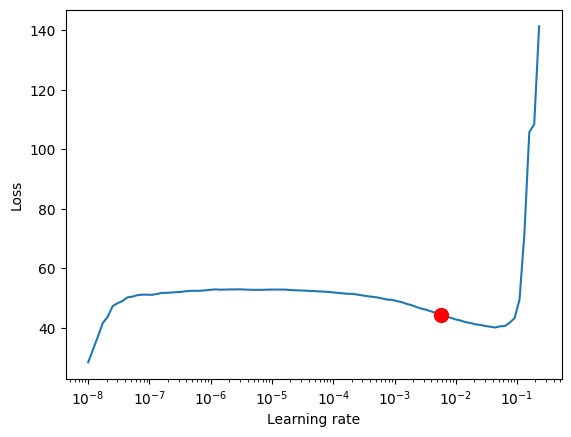

In [ ]:
from lightning.pytorch.tuner import Tuner

# Create a Tuner
tuner = Tuner(trainer)

# Finding the learning rate
lr_finder =tuner.lr_find(model)

# Plot with
fig = lr_finder.plot(suggest=True)
fig.show()

# Pick point based on plot, or get suggestion
new_lr = lr_finder.suggestion()

# update hparams of the model
model.hparams.learning_rate = new_lr

### Model Training

INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
  | Name    | Type     | Params
-------------------------------------
0 | model   | YOLOv3   | 61.6 M
1 | loss_fn | YoloLoss | 0     
-------------------------------------
61.6 M    Trainable params
0         Non-trainable params
61.6 M    Total params
246.506   Total estimated model params size (MB)
INFO:lightning.pytorch.callbacks.model_summary:
  | Name    | Type     | Params
-------------------------------------
0 | model   | YOLOv3   | 61.6 M
1 | loss_fn | YoloLoss | 0     
-------------------------------------
61.6 M    Trainable params
0         Non-trainable params
61.6 M    Total params
246.506   Total estimated model params size (MB)


Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

/usr/local/lib/python3.10/dist-packages/torch/optim/lr_scheduler.py:139: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  warnings.warn("Detected call of `lr_scheduler.step()` before `optimizer.step()`. "


Validation: 0it [00:00, ?it/s]

  0%|          | 0/1035 [00:00<?, ?it/s]

Epoch: 1
Train Metrics
Loss: 20.10720443725586
Class Accuracy: 33.600000%
No Object Accuracy: 99.370000%
Object Accuracy: 0.690000%


Validation: 0it [00:00, ?it/s]

  0%|          | 0/1035 [00:00<?, ?it/s]

Epoch: 2
Train Metrics
Loss: 12.548933982849121
Class Accuracy: 37.050000%
No Object Accuracy: 100.000000%
Object Accuracy: 0.010000%


Validation: 0it [00:00, ?it/s]

  0%|          | 0/1035 [00:00<?, ?it/s]

Epoch: 3
Train Metrics
Loss: 11.353577613830566
Class Accuracy: 41.110000%
No Object Accuracy: 98.490000%
Object Accuracy: 22.120000%


Validation: 0it [00:00, ?it/s]

  0%|          | 0/1035 [00:00<?, ?it/s]

Epoch: 4
Train Metrics
Loss: 10.45605754852295
Class Accuracy: 42.930000%
No Object Accuracy: 97.350000%
Object Accuracy: 40.920000%


Validation: 0it [00:00, ?it/s]

  0%|          | 0/1035 [00:00<?, ?it/s]

Epoch: 5
Train Metrics
Loss: 9.827069282531738
Class Accuracy: 46.010000%
No Object Accuracy: 97.300000%
Object Accuracy: 45.680000%


Validation: 0it [00:00, ?it/s]

  0%|          | 0/1035 [00:00<?, ?it/s]

Epoch: 6
Train Metrics
Loss: 9.319076538085938
Class Accuracy: 49.210000%
No Object Accuracy: 97.000000%
Object Accuracy: 53.410000%


Validation: 0it [00:00, ?it/s]

  0%|          | 0/1035 [00:00<?, ?it/s]

Epoch: 7
Train Metrics
Loss: 9.58796501159668
Class Accuracy: 51.260000%
No Object Accuracy: 97.170000%
Object Accuracy: 53.950000%


Validation: 0it [00:00, ?it/s]

  0%|          | 0/1035 [00:00<?, ?it/s]

Epoch: 8
Train Metrics
Loss: 8.670565605163574
Class Accuracy: 52.900000%
No Object Accuracy: 97.340000%
Object Accuracy: 56.340000%


Validation: 0it [00:00, ?it/s]

  0%|          | 0/1035 [00:00<?, ?it/s]

Epoch: 9
Train Metrics
Loss: 8.364895820617676
Class Accuracy: 52.910000%
No Object Accuracy: 97.600000%
Object Accuracy: 51.680000%


Validation: 0it [00:00, ?it/s]

  0%|          | 0/1035 [00:00<?, ?it/s]

Epoch: 10
Train Metrics
Loss: 8.09145736694336
Class Accuracy: 56.250000%
No Object Accuracy: 97.700000%
Object Accuracy: 56.590000%


  0%|          | 0/310 [00:00<?, ?it/s]

Test Metrics
Class Accuracy: 62.680000%
No Object Accuracy: 97.900000%
Object Accuracy: 50.080000%


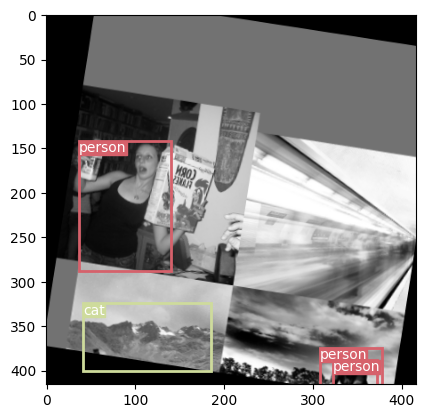

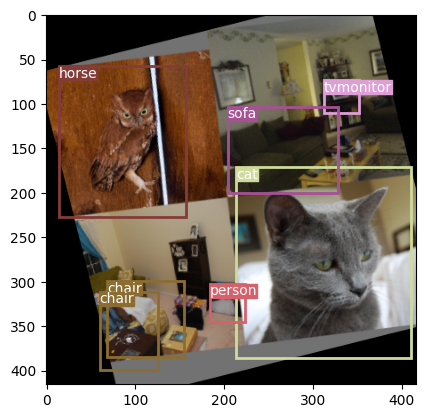

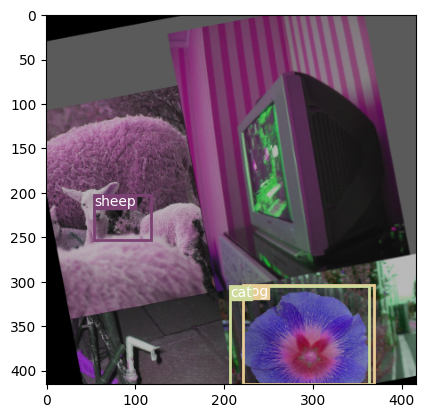

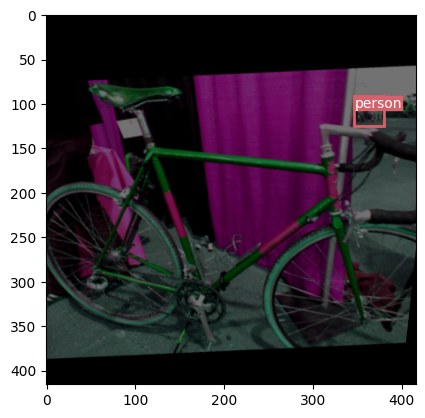

Validation: 0it [00:00, ?it/s]

  0%|          | 0/1035 [00:00<?, ?it/s]

Epoch: 11
Train Metrics
Loss: 7.915757656097412
Class Accuracy: 57.770000%
No Object Accuracy: 97.470000%
Object Accuracy: 58.840000%


Validation: 0it [00:00, ?it/s]

  0%|          | 0/1035 [00:00<?, ?it/s]

Epoch: 12
Train Metrics
Loss: 7.621766567230225
Class Accuracy: 59.620000%
No Object Accuracy: 97.400000%
Object Accuracy: 61.750000%


Validation: 0it [00:00, ?it/s]

  0%|          | 0/1035 [00:00<?, ?it/s]

Epoch: 13
Train Metrics
Loss: 7.406911373138428
Class Accuracy: 60.870000%
No Object Accuracy: 97.600000%
Object Accuracy: 63.310000%


Validation: 0it [00:00, ?it/s]

  0%|          | 0/1035 [00:00<?, ?it/s]

Epoch: 14
Train Metrics
Loss: 7.1739325523376465
Class Accuracy: 62.010000%
No Object Accuracy: 97.580000%
Object Accuracy: 62.790000%


Validation: 0it [00:00, ?it/s]

  0%|          | 0/1035 [00:00<?, ?it/s]

Epoch: 15
Train Metrics
Loss: 6.972394943237305
Class Accuracy: 61.360000%
No Object Accuracy: 97.750000%
Object Accuracy: 60.520000%


Validation: 0it [00:00, ?it/s]

  0%|          | 0/1035 [00:00<?, ?it/s]

Epoch: 16
Train Metrics
Loss: 6.761254787445068
Class Accuracy: 64.360000%
No Object Accuracy: 97.580000%
Object Accuracy: 65.210000%


Validation: 0it [00:00, ?it/s]

  0%|          | 0/1035 [00:00<?, ?it/s]

Epoch: 17
Train Metrics
Loss: 6.571312427520752
Class Accuracy: 66.450000%
No Object Accuracy: 97.590000%
Object Accuracy: 65.830000%


Validation: 0it [00:00, ?it/s]

  0%|          | 0/1035 [00:00<?, ?it/s]

Epoch: 18
Train Metrics
Loss: 6.382364273071289
Class Accuracy: 67.130000%
No Object Accuracy: 97.750000%
Object Accuracy: 66.310000%


Validation: 0it [00:00, ?it/s]

  0%|          | 0/1035 [00:00<?, ?it/s]

Epoch: 19
Train Metrics
Loss: 6.252953052520752
Class Accuracy: 68.490000%
No Object Accuracy: 97.610000%
Object Accuracy: 68.800000%


Validation: 0it [00:00, ?it/s]

  0%|          | 0/1035 [00:00<?, ?it/s]

Epoch: 20
Train Metrics
Loss: 6.042286396026611
Class Accuracy: 69.380000%
No Object Accuracy: 97.610000%
Object Accuracy: 69.880000%


  0%|          | 0/310 [00:00<?, ?it/s]

Test Metrics
Class Accuracy: 76.040000%
No Object Accuracy: 97.620000%
Object Accuracy: 68.790000%


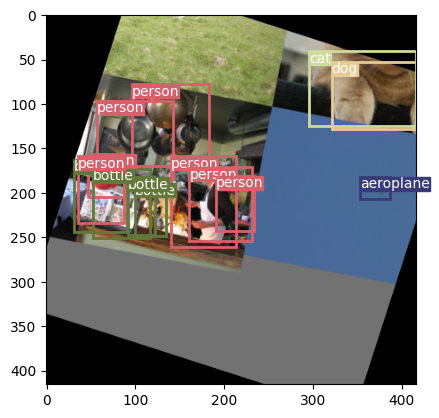

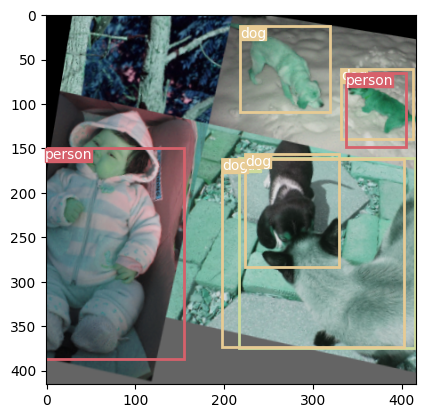

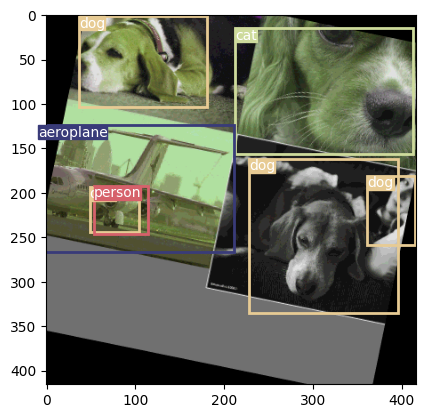

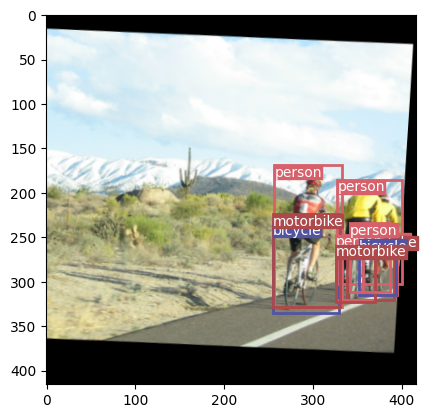

Validation: 0it [00:00, ?it/s]

  0%|          | 0/1035 [00:00<?, ?it/s]

Epoch: 21
Train Metrics
Loss: 5.917768955230713
Class Accuracy: 70.910000%
No Object Accuracy: 97.860000%
Object Accuracy: 69.050000%


Validation: 0it [00:00, ?it/s]

  0%|          | 0/1035 [00:00<?, ?it/s]

Epoch: 22
Train Metrics
Loss: 5.761763095855713
Class Accuracy: 71.290000%
No Object Accuracy: 97.720000%
Object Accuracy: 70.640000%


Validation: 0it [00:00, ?it/s]

  0%|          | 0/1035 [00:00<?, ?it/s]

Epoch: 23
Train Metrics
Loss: 5.640405654907227
Class Accuracy: 72.480000%
No Object Accuracy: 97.950000%
Object Accuracy: 69.870000%


Validation: 0it [00:00, ?it/s]

  0%|          | 0/1035 [00:00<?, ?it/s]

Epoch: 24
Train Metrics
Loss: 5.477851867675781
Class Accuracy: 73.950000%
No Object Accuracy: 97.780000%
Object Accuracy: 71.230000%


Validation: 0it [00:00, ?it/s]

  0%|          | 0/1035 [00:00<?, ?it/s]

Epoch: 25
Train Metrics
Loss: 5.3673553466796875
Class Accuracy: 74.270000%
No Object Accuracy: 97.740000%
Object Accuracy: 72.600000%


Validation: 0it [00:00, ?it/s]

  0%|          | 0/1035 [00:00<?, ?it/s]

Epoch: 26
Train Metrics
Loss: 5.241785526275635
Class Accuracy: 75.320000%
No Object Accuracy: 97.810000%
Object Accuracy: 72.130000%


Validation: 0it [00:00, ?it/s]

  0%|          | 0/1035 [00:00<?, ?it/s]

Epoch: 27
Train Metrics
Loss: 5.129232406616211
Class Accuracy: 75.940000%
No Object Accuracy: 97.840000%
Object Accuracy: 73.000000%


Validation: 0it [00:00, ?it/s]

  0%|          | 0/1035 [00:00<?, ?it/s]

Epoch: 28
Train Metrics
Loss: 5.001034736633301
Class Accuracy: 77.130000%
No Object Accuracy: 97.750000%
Object Accuracy: 74.410000%


Validation: 0it [00:00, ?it/s]

  0%|          | 0/1035 [00:00<?, ?it/s]

Epoch: 29
Train Metrics
Loss: 4.883327484130859
Class Accuracy: 77.640000%
No Object Accuracy: 97.870000%
Object Accuracy: 73.740000%


Validation: 0it [00:00, ?it/s]

  0%|          | 0/1035 [00:00<?, ?it/s]

Epoch: 30
Train Metrics
Loss: 4.782393455505371
Class Accuracy: 78.340000%
No Object Accuracy: 97.920000%
Object Accuracy: 74.510000%


  0%|          | 0/310 [00:00<?, ?it/s]

Test Metrics
Class Accuracy: 83.380000%
No Object Accuracy: 97.990000%
Object Accuracy: 72.440000%


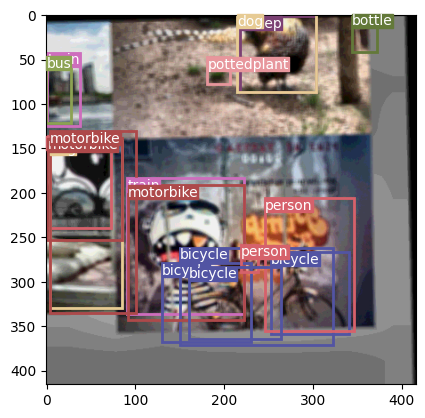

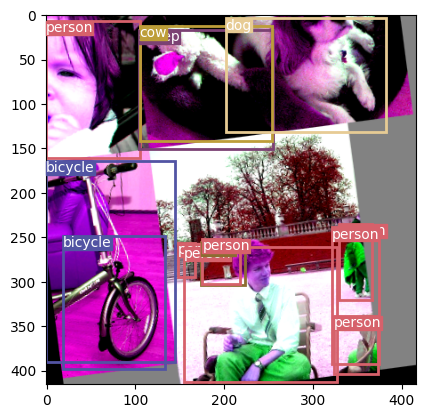

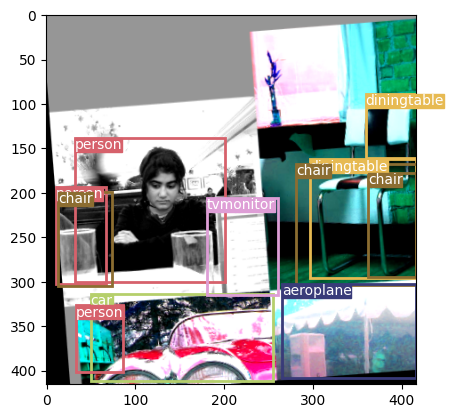

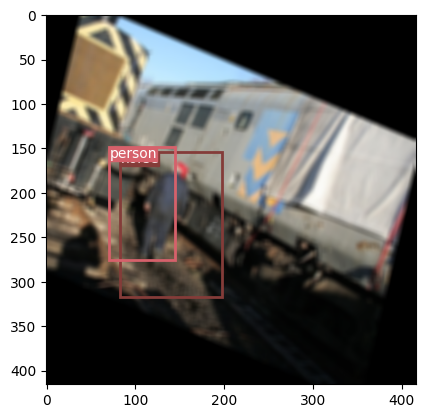

Validation: 0it [00:00, ?it/s]

  0%|          | 0/1035 [00:00<?, ?it/s]

Epoch: 31
Train Metrics
Loss: 4.65554666519165
Class Accuracy: 78.590000%
No Object Accuracy: 97.960000%
Object Accuracy: 74.860000%


Validation: 0it [00:00, ?it/s]

  0%|          | 0/1035 [00:00<?, ?it/s]

Epoch: 32
Train Metrics
Loss: 4.558043956756592
Class Accuracy: 79.540000%
No Object Accuracy: 97.930000%
Object Accuracy: 75.550000%


Validation: 0it [00:00, ?it/s]

  0%|          | 0/1035 [00:00<?, ?it/s]

Epoch: 33
Train Metrics
Loss: 4.444476127624512
Class Accuracy: 80.560000%
No Object Accuracy: 97.940000%
Object Accuracy: 76.330000%


Validation: 0it [00:00, ?it/s]

  0%|          | 0/1035 [00:00<?, ?it/s]

Epoch: 34
Train Metrics
Loss: 4.338178634643555
Class Accuracy: 81.590000%
No Object Accuracy: 98.000000%
Object Accuracy: 76.040000%


Validation: 0it [00:00, ?it/s]

  0%|          | 0/1035 [00:00<?, ?it/s]

Epoch: 35
Train Metrics
Loss: 4.190375804901123
Class Accuracy: 82.310000%
No Object Accuracy: 98.070000%
Object Accuracy: 76.380000%


Validation: 0it [00:00, ?it/s]

  0%|          | 0/1035 [00:00<?, ?it/s]

Epoch: 36
Train Metrics
Loss: 4.0632147789001465
Class Accuracy: 83.070000%
No Object Accuracy: 98.060000%
Object Accuracy: 77.060000%


Validation: 0it [00:00, ?it/s]

  0%|          | 0/1035 [00:00<?, ?it/s]

Epoch: 37
Train Metrics
Loss: 3.9672653675079346
Class Accuracy: 83.670000%
No Object Accuracy: 98.060000%
Object Accuracy: 77.460000%


Validation: 0it [00:00, ?it/s]

  0%|          | 0/1035 [00:00<?, ?it/s]

Epoch: 38
Train Metrics
Loss: 3.9182791709899902
Class Accuracy: 84.070000%
No Object Accuracy: 98.040000%
Object Accuracy: 78.190000%


Validation: 0it [00:00, ?it/s]

  0%|          | 0/1035 [00:00<?, ?it/s]

Epoch: 39
Train Metrics
Loss: 3.7912819385528564
Class Accuracy: 84.730000%
No Object Accuracy: 98.110000%
Object Accuracy: 78.250000%


Validation: 0it [00:00, ?it/s]

  0%|          | 0/1035 [00:00<?, ?it/s]

Epoch: 40
Train Metrics
Loss: 3.7492988109588623
Class Accuracy: 85.120000%
No Object Accuracy: 98.120000%
Object Accuracy: 78.490000%


  0%|          | 0/310 [00:00<?, ?it/s]

Test Metrics
Class Accuracy: 86.870000%
No Object Accuracy: 98.230000%
Object Accuracy: 75.170000%


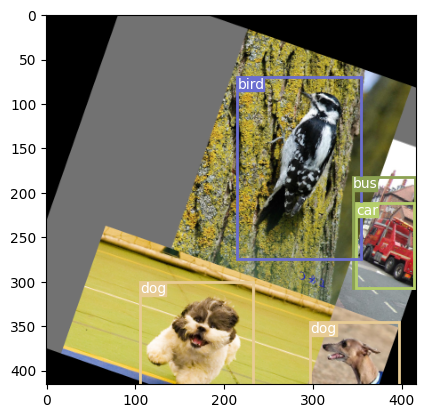

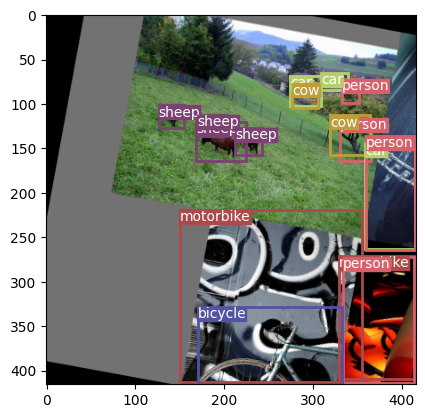

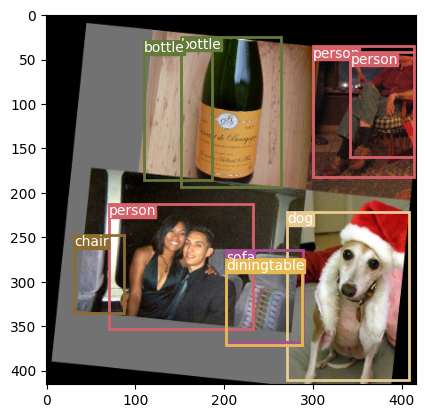

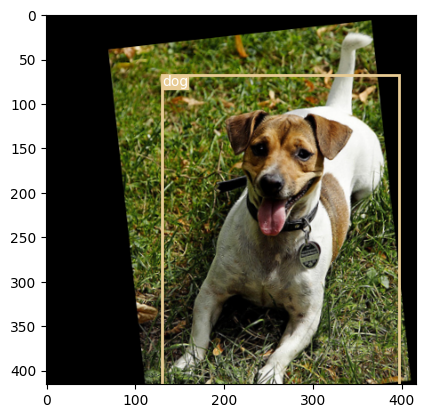

  0%|          | 0/310 [00:00<?, ?it/s]

MAP:  0.40477901697158813


INFO: `Trainer.fit` stopped: `max_epochs=40` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=40` reached.


In [ ]:
# trainer = pl.Trainer(precision=16,max_epochs=1)
trainer.fit(model)

### Model testing

In [ ]:
trainer.test()

/usr/local/lib/python3.10/dist-packages/lightning/pytorch/trainer/connectors/checkpoint_connector.py:148: UserWarning: `.test(ckpt_path=None)` was called without a model. The best model of the previous `fit` call will be used. You can pass `.test(ckpt_path='best')` to use the best model or `.test(ckpt_path='last')` to use the last model. If you pass a value, this warning will be silenced.
  rank_zero_warn(
INFO: Restoring states from the checkpoint path at /content/checkpoints/epoch=39-step=41400.ckpt
INFO:lightning.pytorch.utilities.rank_zero:Restoring states from the checkpoint path at /content/checkpoints/epoch=39-step=41400.ckpt
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: Loaded model weights from the checkpoint at /content/checkpoints/epoch=39-step=41400.ckpt
INFO:lightning.pytorch.utilities.rank_zero:Loaded model weights from the checkpoint at /content/checkpoints/epoch=39-step=41400.ckpt

Testing: 0it [00:00, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│      test_loss_epoch      │     4.106248378753662     │
└───────────────────────────┴───────────────────────────┘

[{'test_loss_epoch': 4.106248378753662}]

### Tensorboard Logs

In [ ]:
# start tensorboard
%load_ext tensorboard
%tensorboard --logdir lightning_logs/

<IPython.core.display.Javascript object>

#### Total execution time

In [ ]:
t1 = time.time()
total = t1-t0
print("Time Taken: ", round(total/3600,2))

Time Taken:  3.85


### Saving the model and copying it back to Google Drive

In [ ]:
# # Save the model
torch.save(model.state_dict(), "custom_yolo_model_v3.pth")

!cp custom_yolo_model_v3.pth gdrive/MyDrive/ERA_Pascal_VOC/